In [1]:
%matplotlib inline

import numpy as np
import matplotlib.pyplot as plt
from construct import *
import scipy.signal

import sys
sys.path.append('../Tianwen/') # to import ccsds
import ccsds

import struct
import collections
import pathlib
import string

plt.rcParams['figure.figsize'] = (10, 5)
plt.rcParams['figure.facecolor'] = 'w'

In [2]:
AOSFrame = Struct(
    'primary_header' / ccsds.AOSPrimaryHeader,
    'm_pdu_header' / ccsds.M_PDU_Header,
    'm_pdu_packet_zone' / Bytes(1100-ccsds.AOSPrimaryHeader.sizeof()-ccsds.M_PDU_Header.sizeof()-4),
    'trailer' / Bytes(4),
)

CLCW = BitStruct(
    'control_word_type' / Flag,
    'clcw_version_number' / BitsInteger(2),
    'status_field' / BitsInteger(3),
    'cop_in_effect' / BitsInteger(2),
    'virtual_channel_identification' / BitsInteger(6),
    'rsvd_spare' / BitsInteger(2),
    'no_rf_avail' / Flag,
    'no_bit_lock' / Flag,
    'lock_out' / Flag,
    'wait' / Flag,
    'retransmit' / Flag,
    'farm_b_counter' / BitsInteger(2),
    'rsvd_spare2' / BitsInteger(1),
    'report_value' / BitsInteger(8)
)

def packets_asarray(packets):
    packets = [np.frombuffer(p[ccsds.SpacePacketPrimaryHeader.sizeof():], 'uint8')
               for p in packets]
    l = np.max([p.size for p in packets])
    packets = [np.concatenate((p, np.zeros(l-p.size, 'uint8'))) for p in packets]
    return np.array(packets)

def plot_apids(apids, vc=0):
    for apid in sorted(apids.keys()):
        plt.figure(figsize = (16,16), facecolor = 'w')
        ps = packets_asarray(apids[apid])
        plt.imshow(ps, aspect = ps.shape[1]/ps.shape[0], interpolation='none')
        plt.title(f"JWST APID {apid} Virtual channel {vc}")

In [3]:
def load_frames(path):
    frame_size = 1100
    frames = np.fromfile(path, dtype = 'uint8')
    frames = frames[:frames.size//frame_size*frame_size].reshape((-1, frame_size))
    return frames

In [4]:
frames = load_frames('jwst_frames_ATA_2021-12-26.u8')
frames.shape[0]

44174

# AOS Frames

In [5]:
aos = [AOSFrame.parse(f) for f in frames]

In [6]:
collections.Counter([a.primary_header.transfer_frame_version_number for a in aos])

Counter({1: 44172, 2: 1, 3: 1})

In [7]:
collections.Counter([a.primary_header.spacecraft_id for a in aos
                     if a.primary_header.transfer_frame_version_number == 1])

Counter({170: 44172})

In [8]:
collections.Counter([a.primary_header.virtual_channel_id for a in aos
                     if a.primary_header.transfer_frame_version_number == 1])

Counter({0: 41930, 63: 2242})

# Virtual channel 63

In [9]:
vc63 = [a for a in aos if a.primary_header.virtual_channel_id == 63]
[a.primary_header for a in vc63[:5]]

[Container(transfer_frame_version_number=1, spacecraft_id=170, virtual_channel_id=63, virtual_channel_frame_count=146694, replay_flag=False, vc_frame_count_usage_flag=False, rsvd_spare=0, vc_framecount_cycle=0),
 Container(transfer_frame_version_number=1, spacecraft_id=170, virtual_channel_id=63, virtual_channel_frame_count=146695, replay_flag=False, vc_frame_count_usage_flag=False, rsvd_spare=0, vc_framecount_cycle=0),
 Container(transfer_frame_version_number=1, spacecraft_id=170, virtual_channel_id=63, virtual_channel_frame_count=146696, replay_flag=False, vc_frame_count_usage_flag=False, rsvd_spare=0, vc_framecount_cycle=0),
 Container(transfer_frame_version_number=1, spacecraft_id=170, virtual_channel_id=63, virtual_channel_frame_count=146697, replay_flag=False, vc_frame_count_usage_flag=False, rsvd_spare=0, vc_framecount_cycle=0),
 Container(transfer_frame_version_number=1, spacecraft_id=170, virtual_channel_id=63, virtual_channel_frame_count=146698, replay_flag=False, vc_frame_co

In [10]:
vc63_frames = np.array([f for f, a in zip(frames, aos) if a.primary_header.virtual_channel_id == 63])

In [11]:
np.all(vc63_frames[:, ccsds.AOSPrimaryHeader.sizeof():] == 120)

True

In [12]:
hex(120)

'0x78'

In [13]:
bytes([120])

b'x'

In [14]:
fc = np.array([a.primary_header.virtual_channel_frame_count for a in vc63])

(-1.0, 15.0)

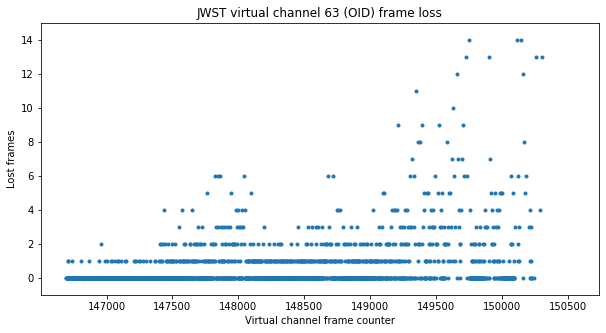

In [15]:
plt.figure(figsize = (10, 5), facecolor = 'w')
plt.plot(fc[1:], np.diff(fc)-1, '.')
plt.title("JWST virtual channel 63 (OID) frame loss")
plt.xlabel('Virtual channel frame counter')
plt.ylabel('Lost frames')
plt.ylim((-1, 15))

# Virtual channel 0

In [16]:
vc0 = [a for a in aos if a.primary_header.virtual_channel_id == 0]
[a.primary_header for a in vc0[:5]]

[Container(transfer_frame_version_number=1, spacecraft_id=170, virtual_channel_id=0, virtual_channel_frame_count=576066, replay_flag=False, vc_frame_count_usage_flag=False, rsvd_spare=0, vc_framecount_cycle=0),
 Container(transfer_frame_version_number=1, spacecraft_id=170, virtual_channel_id=0, virtual_channel_frame_count=576067, replay_flag=False, vc_frame_count_usage_flag=False, rsvd_spare=0, vc_framecount_cycle=0),
 Container(transfer_frame_version_number=1, spacecraft_id=170, virtual_channel_id=0, virtual_channel_frame_count=576068, replay_flag=False, vc_frame_count_usage_flag=False, rsvd_spare=0, vc_framecount_cycle=0),
 Container(transfer_frame_version_number=1, spacecraft_id=170, virtual_channel_id=0, virtual_channel_frame_count=576069, replay_flag=False, vc_frame_count_usage_flag=False, rsvd_spare=0, vc_framecount_cycle=0),
 Container(transfer_frame_version_number=1, spacecraft_id=170, virtual_channel_id=0, virtual_channel_frame_count=576070, replay_flag=False, vc_frame_count_u

In [17]:
fc = np.array([a.primary_header.virtual_channel_frame_count for a in vc0])

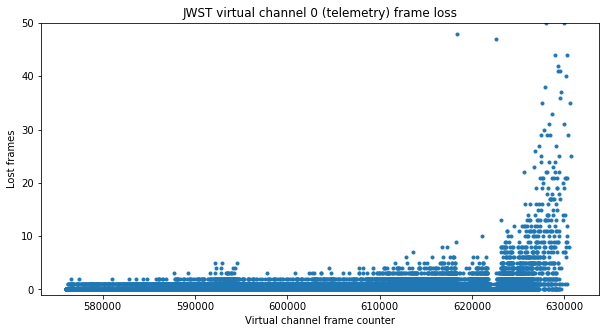

In [18]:
plt.figure(figsize = (10, 5), facecolor = 'w')
plt.plot(fc[1:], np.diff(fc)-1, '.')
plt.title("JWST virtual channel 0 (telemetry) frame loss")
plt.xlabel('Virtual channel frame counter')
plt.ylabel('Lost frames')
plt.ylim((-1, 50));

In [19]:
fc.size/(fc[-1]-fc[0]+1)

0.76333515383215

In [20]:
[a.trailer.hex()for a in vc0[:10]]

['010001eb',
 '0904019e',
 '09080100',
 '010001eb',
 '0904019e',
 '09080100',
 '010001eb',
 '0904019e',
 '09080100',
 '010001eb']

In [21]:
[CLCW.parse(a.trailer) for a in vc0[:10]]

[Container(control_word_type=False, clcw_version_number=0, status_field=0, cop_in_effect=1, virtual_channel_identification=0, rsvd_spare=0, no_rf_avail=False, no_bit_lock=False, lock_out=False, wait=False, retransmit=False, farm_b_counter=0, rsvd_spare2=1, report_value=235),
 Container(control_word_type=False, clcw_version_number=0, status_field=2, cop_in_effect=1, virtual_channel_identification=1, rsvd_spare=0, no_rf_avail=False, no_bit_lock=False, lock_out=False, wait=False, retransmit=False, farm_b_counter=0, rsvd_spare2=1, report_value=158),
 Container(control_word_type=False, clcw_version_number=0, status_field=2, cop_in_effect=1, virtual_channel_identification=2, rsvd_spare=0, no_rf_avail=False, no_bit_lock=False, lock_out=False, wait=False, retransmit=False, farm_b_counter=0, rsvd_spare2=1, report_value=0),
 Container(control_word_type=False, clcw_version_number=0, status_field=0, cop_in_effect=1, virtual_channel_identification=0, rsvd_spare=0, no_rf_avail=False, no_bit_lock=Fal

In [22]:
vc0_packets = list(ccsds.extract_space_packets(vc0, 170, 0))

/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 576199, current frame count 576201
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 576242, current frame count 576244
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 576263, current frame count 576265
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last fr

/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 577355, current frame count 577357
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 577471, current frame count 577473
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 577489, current frame count 577492
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last fr

/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 578607, current frame count 578609
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 578628, current frame count 578630
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 578672, current frame count 578674
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last fr

/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 579308, current frame count 579310
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 579335, current frame count 579337
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 579370, current frame count 579372
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last fr

/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 580249, current frame count 580251
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 580276, current frame count 580278
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 580291, current frame count 580293
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last fr

/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 581106, current frame count 581108
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 581175, current frame count 581177
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 581199, current frame count 581201
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last fr

/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 582214, current frame count 582216
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 582313, current frame count 582315
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 582334, current frame count 582336
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last fr

/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 583205, current frame count 583207
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 583214, current frame count 583216
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 583219, current frame count 583221
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last fr

/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 583915, current frame count 583917
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 583923, current frame count 583925
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 583937, current frame count 583939
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last fr

/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 584719, current frame count 584721
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 584735, current frame count 584737
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 584737, current frame count 584739
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last fr

/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 585583, current frame count 585585
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 585586, current frame count 585588
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 585650, current frame count 585652
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last fr

/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 586163, current frame count 586165
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 586223, current frame count 586225
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 586228, current frame count 586230
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last fr

/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 586654, current frame count 586656
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 586657, current frame count 586659
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 586677, current frame count 586679
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last fr

/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 587149, current frame count 587151
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 587194, current frame count 587196
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 587256, current frame count 587258
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last fr

/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 587644, current frame count 587646
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 587688, current frame count 587690
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 587695, current frame count 587697
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last fr

/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 588077, current frame count 588079
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 588088, current frame count 588091
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 588101, current frame count 588103
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last fr

/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 588445, current frame count 588447
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 588470, current frame count 588472
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 588474, current frame count 588476
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last fr

/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 588709, current frame count 588711
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 588714, current frame count 588716
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 588716, current frame count 588718
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last fr

/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 588887, current frame count 588889
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 588903, current frame count 588905
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 588912, current frame count 588914
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last fr

/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 589277, current frame count 589281
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 589285, current frame count 589287
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 589297, current frame count 589299
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last fr

/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 589560, current frame count 589562
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 589574, current frame count 589576
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 589586, current frame count 589588
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last fr

/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 589922, current frame count 589924
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 589945, current frame count 589947
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 589969, current frame count 589971
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last fr

/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 590280, current frame count 590282
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 590282, current frame count 590284
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 590296, current frame count 590298
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last fr

/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 590552, current frame count 590554
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 590557, current frame count 590559
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 590571, current frame count 590573
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last fr

/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 590844, current frame count 590846
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 590847, current frame count 590849
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 590852, current frame count 590854
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last fr

/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 591136, current frame count 591138
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 591182, current frame count 591184
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 591193, current frame count 591195
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last fr

/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 591474, current frame count 591476
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 591499, current frame count 591501
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 591503, current frame count 591505
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last fr

/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 591701, current frame count 591703
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 591703, current frame count 591705
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 591711, current frame count 591713
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last fr

/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 591990, current frame count 591992
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 591996, current frame count 591998
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 591998, current frame count 592000
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last fr

/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 592204, current frame count 592207
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 592218, current frame count 592221
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 592221, current frame count 592223
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last fr

/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 592415, current frame count 592417
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 592431, current frame count 592433
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 592433, current frame count 592435
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last fr

/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 592603, current frame count 592605
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 592610, current frame count 592613
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 592620, current frame count 592622
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last fr

/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 592790, current frame count 592792
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 592794, current frame count 592796
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 592796, current frame count 592799
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last fr

/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 592983, current frame count 592985
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 592991, current frame count 592993
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 592998, current frame count 593000
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last fr

/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 593188, current frame count 593190
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 593193, current frame count 593195
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 593208, current frame count 593211
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last fr

/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 593465, current frame count 593467
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 593472, current frame count 593474
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 593476, current frame count 593478
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last fr

/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 593647, current frame count 593649
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 593653, current frame count 593655
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 593657, current frame count 593659
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last fr

/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 593848, current frame count 593850
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 593850, current frame count 593852
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 593853, current frame count 593855
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last fr

/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 594024, current frame count 594026
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 594031, current frame count 594034
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 594034, current frame count 594036
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last fr

/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 594191, current frame count 594193
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 594198, current frame count 594200
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 594201, current frame count 594203
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last fr

/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 594373, current frame count 594375
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 594380, current frame count 594382
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 594386, current frame count 594388
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last fr

/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 594580, current frame count 594582
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 594583, current frame count 594589
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 594593, current frame count 594595
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last fr

/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 594762, current frame count 594764
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 594765, current frame count 594767
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 594767, current frame count 594769
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last fr

/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 595137, current frame count 595140
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 595175, current frame count 595178
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 595199, current frame count 595202
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last fr

/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 595564, current frame count 595566
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 595587, current frame count 595589
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 595594, current frame count 595596
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last fr

/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 595957, current frame count 595959
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 595959, current frame count 595961
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 595992, current frame count 595994
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last fr

/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 596244, current frame count 596246
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 596246, current frame count 596248
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 596260, current frame count 596262
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last fr

/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 596796, current frame count 596798
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 596817, current frame count 596819
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 596852, current frame count 596854
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last fr

/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 597364, current frame count 597366
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 597371, current frame count 597373
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 597391, current frame count 597393
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last fr

/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 597987, current frame count 597989
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 597997, current frame count 597999
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 598012, current frame count 598015
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last fr

/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 598381, current frame count 598383
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 598399, current frame count 598401
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 598418, current frame count 598421
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last fr

/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 598651, current frame count 598653
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 598654, current frame count 598656
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 598674, current frame count 598676
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last fr

/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 598963, current frame count 598966
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 598975, current frame count 598977
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 599010, current frame count 599012
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last fr

/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 599343, current frame count 599345
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 599346, current frame count 599348
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 599380, current frame count 599382
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last fr

/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 599766, current frame count 599768
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 599769, current frame count 599771
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 599774, current frame count 599776
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last fr

/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 600153, current frame count 600155
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 600180, current frame count 600182
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 600204, current frame count 600206
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last fr

/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 600594, current frame count 600597
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 600654, current frame count 600656
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 600667, current frame count 600669
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last fr

/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 600948, current frame count 600951
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 600966, current frame count 600969
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 600978, current frame count 600980
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last fr

/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 601355, current frame count 601357
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 601367, current frame count 601369
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 601384, current frame count 601386
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last fr

/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 601681, current frame count 601683
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 601691, current frame count 601693
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 601708, current frame count 601710
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last fr

/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 601930, current frame count 601932
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 601937, current frame count 601939
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 601940, current frame count 601942
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last fr

/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 602316, current frame count 602318
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 602328, current frame count 602330
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 602345, current frame count 602347
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last fr

/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 602613, current frame count 602615
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 602625, current frame count 602629
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 602632, current frame count 602634
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last fr

/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 602882, current frame count 602885
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 602886, current frame count 602888
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 602894, current frame count 602896
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last fr

/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 603077, current frame count 603079
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 603080, current frame count 603082
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 603087, current frame count 603089
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last fr

/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 603284, current frame count 603286
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 603294, current frame count 603296
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 603304, current frame count 603307
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last fr

/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 603583, current frame count 603585
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 603585, current frame count 603587
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 603598, current frame count 603600
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last fr

/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 603875, current frame count 603878
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 603881, current frame count 603883
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 603883, current frame count 603885
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last fr

/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 604080, current frame count 604082
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 604084, current frame count 604086
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 604088, current frame count 604090
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last fr

/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 604285, current frame count 604287
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 604288, current frame count 604290
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 604290, current frame count 604292
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last fr

/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 604562, current frame count 604564
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 604574, current frame count 604576
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 604583, current frame count 604585
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last fr

/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 604756, current frame count 604759
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 604762, current frame count 604764
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 604775, current frame count 604777
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last fr

/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 604951, current frame count 604953
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 604954, current frame count 604956
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 604963, current frame count 604965
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last fr

/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 605144, current frame count 605146
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 605153, current frame count 605155
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 605171, current frame count 605173
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last fr

/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 605419, current frame count 605421
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 605440, current frame count 605442
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 605444, current frame count 605446
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last fr

/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 605713, current frame count 605715
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 605729, current frame count 605731
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 605732, current frame count 605734
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last fr

/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 606084, current frame count 606086
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 606096, current frame count 606099
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 606118, current frame count 606120
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last fr

/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 606472, current frame count 606475
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 606479, current frame count 606481
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 606483, current frame count 606485
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last fr

/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 606663, current frame count 606665
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 606668, current frame count 606670
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 606679, current frame count 606681
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last fr

/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 606950, current frame count 606952
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 606955, current frame count 606957
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 606976, current frame count 606978
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last fr

/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 607232, current frame count 607234
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 607235, current frame count 607238
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 607250, current frame count 607252
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last fr

/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 607642, current frame count 607644
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 607644, current frame count 607646
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 607657, current frame count 607659
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last fr

/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 607917, current frame count 607919
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 607919, current frame count 607921
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 607927, current frame count 607929
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last fr

/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 608190, current frame count 608192
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 608193, current frame count 608195
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 608207, current frame count 608209
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last fr

/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 608463, current frame count 608466
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 608470, current frame count 608472
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 608479, current frame count 608481
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last fr

/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 608758, current frame count 608761
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 608762, current frame count 608764
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 608764, current frame count 608766
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last fr

/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 608935, current frame count 608938
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 608950, current frame count 608952
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 608953, current frame count 608955
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last fr

/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 609152, current frame count 609154
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 609155, current frame count 609157
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 609162, current frame count 609164
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last fr

/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 609356, current frame count 609358
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 609361, current frame count 609363
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 609366, current frame count 609368
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last fr

/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 609562, current frame count 609565
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 609586, current frame count 609588
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 609601, current frame count 609603
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last fr

/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 609860, current frame count 609862
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 609865, current frame count 609868
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 609874, current frame count 609876
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last fr

/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 610033, current frame count 610035
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 610035, current frame count 610037
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 610042, current frame count 610044
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last fr

/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 610231, current frame count 610233
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 610241, current frame count 610245
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 610253, current frame count 610255
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last fr

/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 610427, current frame count 610429
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 610430, current frame count 610435
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 610438, current frame count 610440
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last fr

/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 610613, current frame count 610615
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 610615, current frame count 610617
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 610624, current frame count 610626
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last fr

/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 610873, current frame count 610876
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 610876, current frame count 610878
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 610880, current frame count 610884
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last fr

/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 611065, current frame count 611069
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 611073, current frame count 611075
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 611084, current frame count 611086
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last fr

/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 611273, current frame count 611275
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 611277, current frame count 611279
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 611280, current frame count 611282
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last fr

/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 611469, current frame count 611471
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 611477, current frame count 611479
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 611482, current frame count 611484
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last fr

/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 611674, current frame count 611680
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 611686, current frame count 611688
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 611688, current frame count 611691
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last fr

/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 611900, current frame count 611903
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 611906, current frame count 611908
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 611908, current frame count 611910
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last fr

/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 612018, current frame count 612020
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 612022, current frame count 612024
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 612027, current frame count 612029
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last fr

/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 612222, current frame count 612224
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 612224, current frame count 612226
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 612226, current frame count 612228
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last fr

/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 612407, current frame count 612409
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 612410, current frame count 612415
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 612416, current frame count 612418
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last fr

/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 612598, current frame count 612601
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 612601, current frame count 612603
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 612605, current frame count 612608
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last fr

/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 612833, current frame count 612836
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 612844, current frame count 612846
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 612849, current frame count 612851
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last fr

/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 613027, current frame count 613030
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 613030, current frame count 613032
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 613032, current frame count 613034
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last fr

/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 613146, current frame count 613148
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 613161, current frame count 613163
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 613168, current frame count 613170
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last fr

/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 613336, current frame count 613338
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 613338, current frame count 613341
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 613345, current frame count 613347
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last fr

/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 613562, current frame count 613564
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 613564, current frame count 613566
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 613568, current frame count 613570
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last fr

/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 613784, current frame count 613787
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 613793, current frame count 613796
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 613801, current frame count 613803
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last fr

/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 613900, current frame count 613903
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 613917, current frame count 613920
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 613922, current frame count 613926
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last fr

/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 614086, current frame count 614088
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 614089, current frame count 614091
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 614091, current frame count 614093
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last fr

/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 614250, current frame count 614253
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 614254, current frame count 614256
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 614256, current frame count 614258
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last fr

/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 614390, current frame count 614392
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 614394, current frame count 614397
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 614399, current frame count 614401
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last fr

/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 614593, current frame count 614595
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 614597, current frame count 614599
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 614603, current frame count 614605
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last fr

/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 614712, current frame count 614714
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 614715, current frame count 614717
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 614717, current frame count 614720
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last fr

/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 614846, current frame count 614848
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 614853, current frame count 614855
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 614863, current frame count 614865
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last fr

/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 614973, current frame count 614975
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 614975, current frame count 614978
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 614985, current frame count 614988
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last fr

/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 615150, current frame count 615152
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 615157, current frame count 615159
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 615162, current frame count 615164
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last fr

/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 615321, current frame count 615323
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 615323, current frame count 615325
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 615326, current frame count 615331
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last fr

/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 615494, current frame count 615496
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 615496, current frame count 615498
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 615501, current frame count 615503
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last fr

/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 615678, current frame count 615685
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 615693, current frame count 615695
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 615697, current frame count 615699
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last fr

/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 615898, current frame count 615900
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 615903, current frame count 615906
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 615912, current frame count 615914
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last fr

/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 616080, current frame count 616082
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 616082, current frame count 616086
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 616087, current frame count 616089
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last fr

/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 616265, current frame count 616268
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 616268, current frame count 616271
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 616273, current frame count 616275
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last fr

/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 616448, current frame count 616450
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 616450, current frame count 616452
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 616452, current frame count 616455
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last fr

/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 616617, current frame count 616619
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 616619, current frame count 616621
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 616621, current frame count 616623
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last fr

/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 616734, current frame count 616740
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 616742, current frame count 616744
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 616748, current frame count 616753
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last fr

/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 616937, current frame count 616939
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 616943, current frame count 616945
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 616946, current frame count 616948
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last fr

/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 617045, current frame count 617047
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 617047, current frame count 617050
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 617054, current frame count 617057
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last fr

/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 617152, current frame count 617154
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 617154, current frame count 617158
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 617159, current frame count 617164
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last fr

/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 617284, current frame count 617289
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 617290, current frame count 617292
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 617292, current frame count 617296
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last fr

/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 617410, current frame count 617412
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 617412, current frame count 617415
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 617419, current frame count 617422
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last fr

/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 617610, current frame count 617613
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 617615, current frame count 617617
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 617618, current frame count 617622
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last fr

/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 617737, current frame count 617740
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 617744, current frame count 617746
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 617747, current frame count 617750
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last fr

/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 617889, current frame count 617893
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 617893, current frame count 617896
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 617897, current frame count 617900
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last fr

/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 618088, current frame count 618090
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 618090, current frame count 618097
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 618097, current frame count 618100
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last fr

/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 618233, current frame count 618235
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 618235, current frame count 618237
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 618238, current frame count 618242
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last fr

/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 618442, current frame count 618444
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 618447, current frame count 618449
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 618457, current frame count 618459
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last fr

/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 618677, current frame count 618681
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 618682, current frame count 618684
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 618685, current frame count 618687
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last fr

/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 618925, current frame count 618927
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 618931, current frame count 618933
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 618945, current frame count 618947
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last fr

/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 619263, current frame count 619265
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 619277, current frame count 619279
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 619283, current frame count 619285
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last fr

/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 619438, current frame count 619440
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 619442, current frame count 619444
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 619444, current frame count 619446
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last fr

/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 619686, current frame count 619688
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 619689, current frame count 619691
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 619691, current frame count 619693
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last fr

/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 619882, current frame count 619884
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 619884, current frame count 619886
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 619888, current frame count 619890
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last fr

/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 619981, current frame count 619985
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 619985, current frame count 619987
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 619990, current frame count 619992
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last fr

/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 620096, current frame count 620098
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 620101, current frame count 620103
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 620103, current frame count 620105
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last fr

/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 620282, current frame count 620284
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 620285, current frame count 620287
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 620291, current frame count 620293
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last fr

/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 620389, current frame count 620391
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 620392, current frame count 620395
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 620395, current frame count 620397
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last fr

/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 620496, current frame count 620500
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 620503, current frame count 620507
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 620508, current frame count 620510
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last fr

/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 620619, current frame count 620621
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 620621, current frame count 620623
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 620623, current frame count 620625
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last fr

/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 620732, current frame count 620734
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 620734, current frame count 620736
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 620738, current frame count 620740
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last fr

/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 620828, current frame count 620830
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 620831, current frame count 620834
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 620838, current frame count 620841
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last fr

/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 620925, current frame count 620927
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 620928, current frame count 620930
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 620933, current frame count 620935
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last fr

/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 621132, current frame count 621134
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 621135, current frame count 621137
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 621139, current frame count 621141
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last fr

/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 621320, current frame count 621323
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 621323, current frame count 621327
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 621327, current frame count 621329
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last fr

/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 621425, current frame count 621428
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 621429, current frame count 621431
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 621431, current frame count 621436
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last fr

/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 621634, current frame count 621637
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 621642, current frame count 621644
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 621644, current frame count 621648
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last fr

/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 621955, current frame count 621957
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 621993, current frame count 621995
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 621995, current frame count 621997
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last fr

/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 622755, current frame count 622757
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 622764, current frame count 622767
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 622777, current frame count 622779
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last fr

/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 622940, current frame count 622942
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 622942, current frame count 622944
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 622947, current frame count 622949
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last fr

/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 623182, current frame count 623185
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 623185, current frame count 623191
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 623192, current frame count 623198
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last fr

/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 623319, current frame count 623325
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 623325, current frame count 623331
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 623331, current frame count 623333
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last fr

/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 623467, current frame count 623475
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 623475, current frame count 623478
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 623478, current frame count 623482
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last fr

/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 623593, current frame count 623596
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 623597, current frame count 623599
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 623599, current frame count 623602
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last fr

/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 623716, current frame count 623719
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 623719, current frame count 623723
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 623723, current frame count 623725
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last fr

/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 623873, current frame count 623878
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 623878, current frame count 623882
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 623883, current frame count 623885
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last fr

/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 624039, current frame count 624043
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 624043, current frame count 624047
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 624047, current frame count 624049
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last fr

/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 624249, current frame count 624251
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 624252, current frame count 624255
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 624255, current frame count 624261
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last fr

/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 624351, current frame count 624355
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 624355, current frame count 624357
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 624361, current frame count 624363
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last fr

/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 624554, current frame count 624556
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 624557, current frame count 624560
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 624565, current frame count 624567
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last fr

/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 624701, current frame count 624703
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 624707, current frame count 624710
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 624710, current frame count 624713
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last fr

/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 624919, current frame count 624921
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 624921, current frame count 624926
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 624926, current frame count 624928
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last fr

/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 625178, current frame count 625181
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 625181, current frame count 625183
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 625183, current frame count 625185
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last fr

/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 625361, current frame count 625363
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 625363, current frame count 625365
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 625367, current frame count 625370
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last fr

/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 625585, current frame count 625589
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 625589, current frame count 625591
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 625591, current frame count 625604
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last fr

/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 625801, current frame count 625810
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 625810, current frame count 625812
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 625812, current frame count 625821
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last fr

/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 625969, current frame count 625974
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 625974, current frame count 625979
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 625979, current frame count 625983
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last fr

/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 626108, current frame count 626110
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 626110, current frame count 626116
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 626116, current frame count 626130
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last fr

/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 626300, current frame count 626303
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 626303, current frame count 626308
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 626308, current frame count 626311
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last fr

/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 626462, current frame count 626466
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 626466, current frame count 626474
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 626474, current frame count 626480
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last fr

/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 626681, current frame count 626683
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 626685, current frame count 626691
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 626691, current frame count 626697
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last fr

/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 627069, current frame count 627071
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 627071, current frame count 627077
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 627077, current frame count 627082
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last fr

/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 627651, current frame count 627673
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 627673, current frame count 627683
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 627683, current frame count 627690
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last fr

/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 628225, current frame count 628245
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 628245, current frame count 628247
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 628247, current frame count 628255
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last fr

/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 628789, current frame count 628813
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 628813, current frame count 628817
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 628817, current frame count 628826
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last fr

/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 629408, current frame count 629431
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 629431, current frame count 629450
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last frame count {frame_count}, current frame count {frame_count_new}')
/home/daniel/jupyter_notebooks/JWST/../Tianwen/ccsds.py:79: UserWarning: [Space Packet extractor Spacecraft 170 VC 0] Broken stream. Last frame count 629450, current frame count 629462
  warnings.warn(f'[Space Packet extractor Spacecraft {sc_id} VC {virtual_channel}] Broken stream. Last fr

In [23]:
vc0_sp_headers = [ccsds.SpacePacketPrimaryHeader.parse(p) for p in vc0_packets]

In [24]:
vc0_apids = collections.Counter([p.APID for p in vc0_sp_headers])
vc0_apids

Counter({1416: 10878,
         1727: 44109,
         1732: 329,
         1402: 43559,
         1410: 44190,
         1412: 43846,
         1413: 43890,
         1414: 43932,
         1736: 1394,
         1417: 10879,
         1201: 5403,
         1403: 10558,
         1252: 161,
         1728: 10763,
         1404: 10568,
         1411: 10984,
         1763: 336,
         1401: 11096,
         1415: 10792,
         1306: 336,
         1729: 5552,
         1202: 2712,
         1203: 1307,
         1730: 2699,
         1731: 1300,
         1251: 176,
         1422: 341,
         1754: 323,
         1205: 330,
         1206: 329,
         1204: 682,
         1806: 343,
         1407: 662,
         1755: 353,
         1802: 319,
         1406: 654,
         1756: 333,
         1807: 348,
         1805: 341,
         1432: 164,
         1734: 334,
         1757: 318,
         1431: 348,
         1433: 170,
         1758: 335,
         1439: 318,
         1759: 331,
         1440: 346,
     

In [25]:
vc0_by_apid = {apid : [p for h,p in zip(vc0_sp_headers, vc0_packets)
                       if h.APID == apid] for apid in vc0_apids}

<ipython-input-2-caad5dd3ba67>:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize = (16,16), facecolor = 'w')


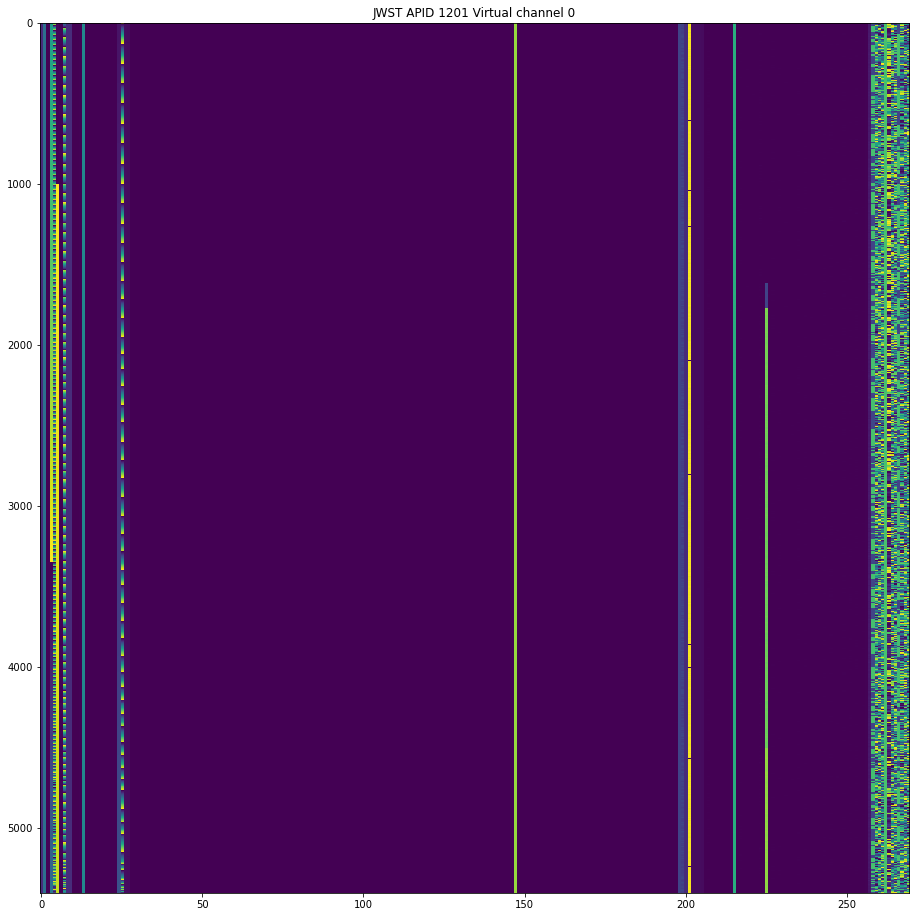

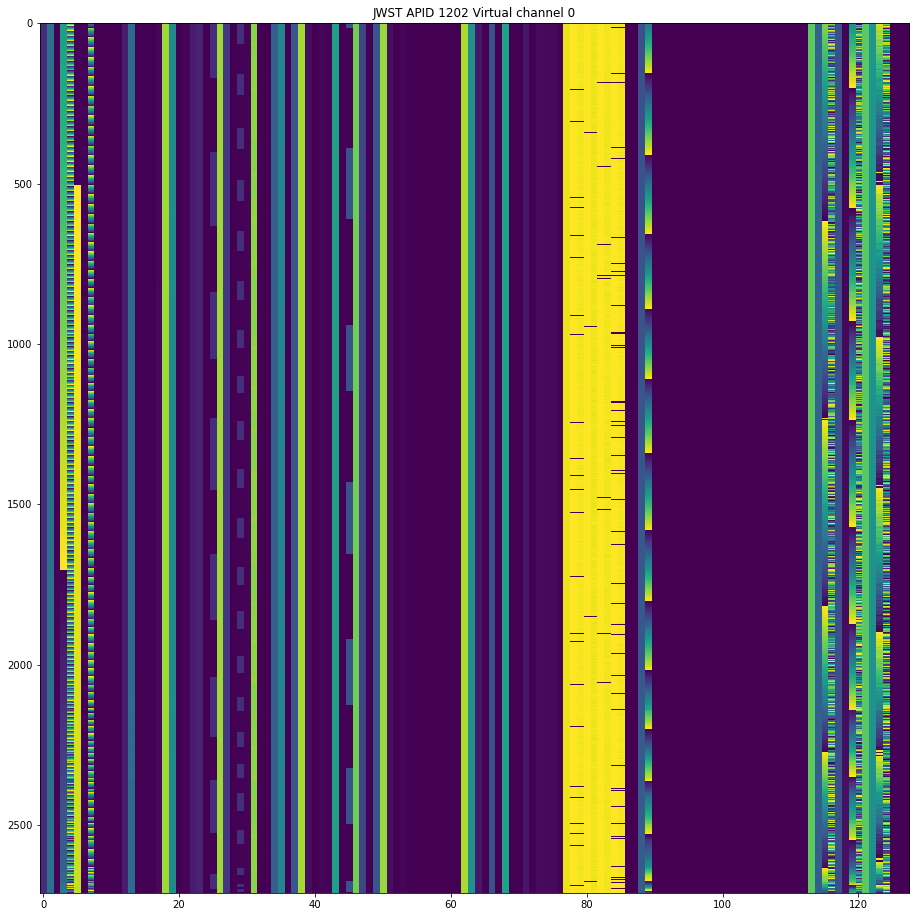

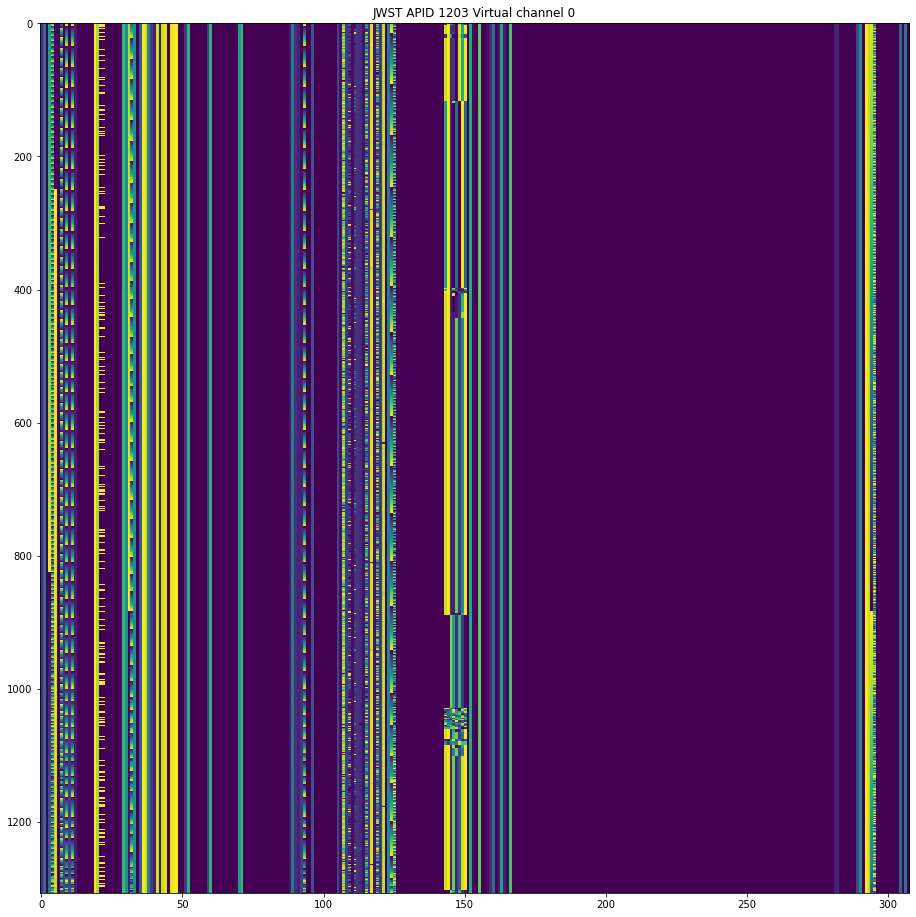

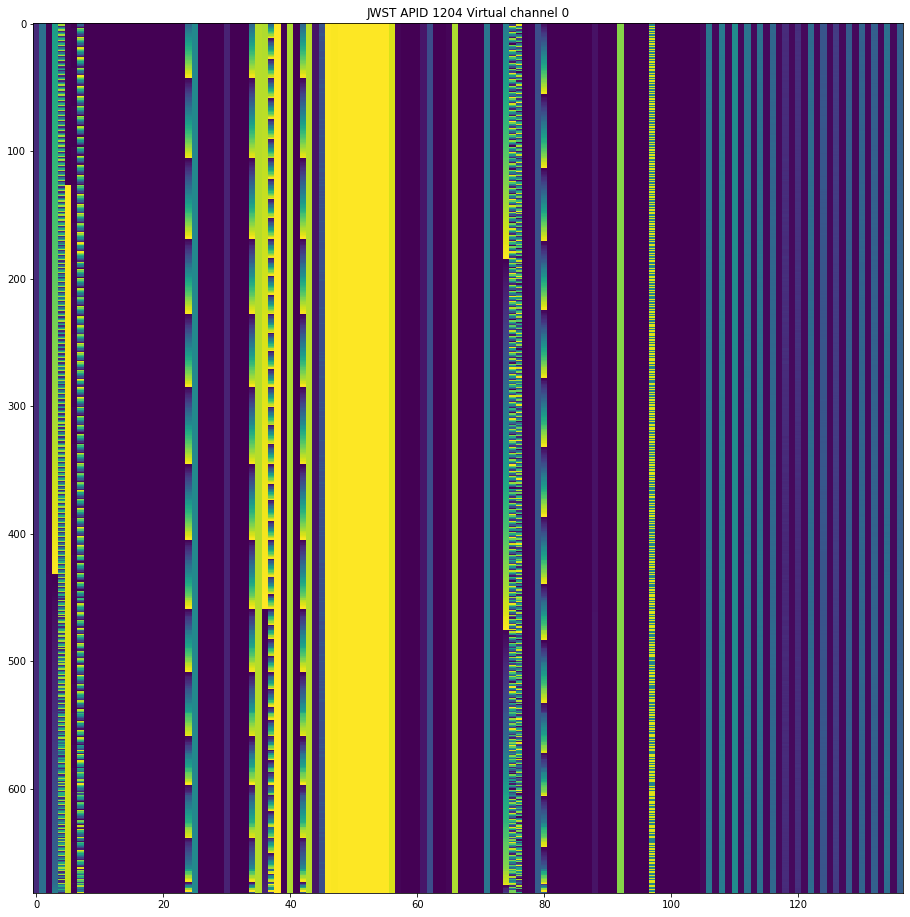

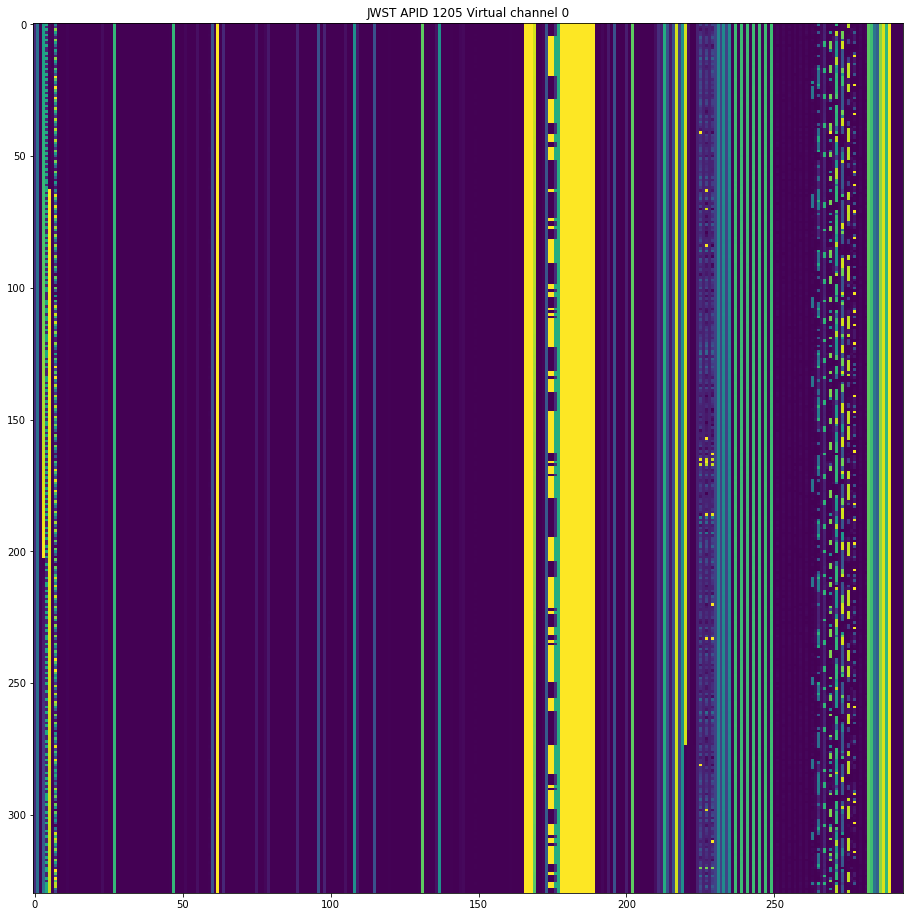

...

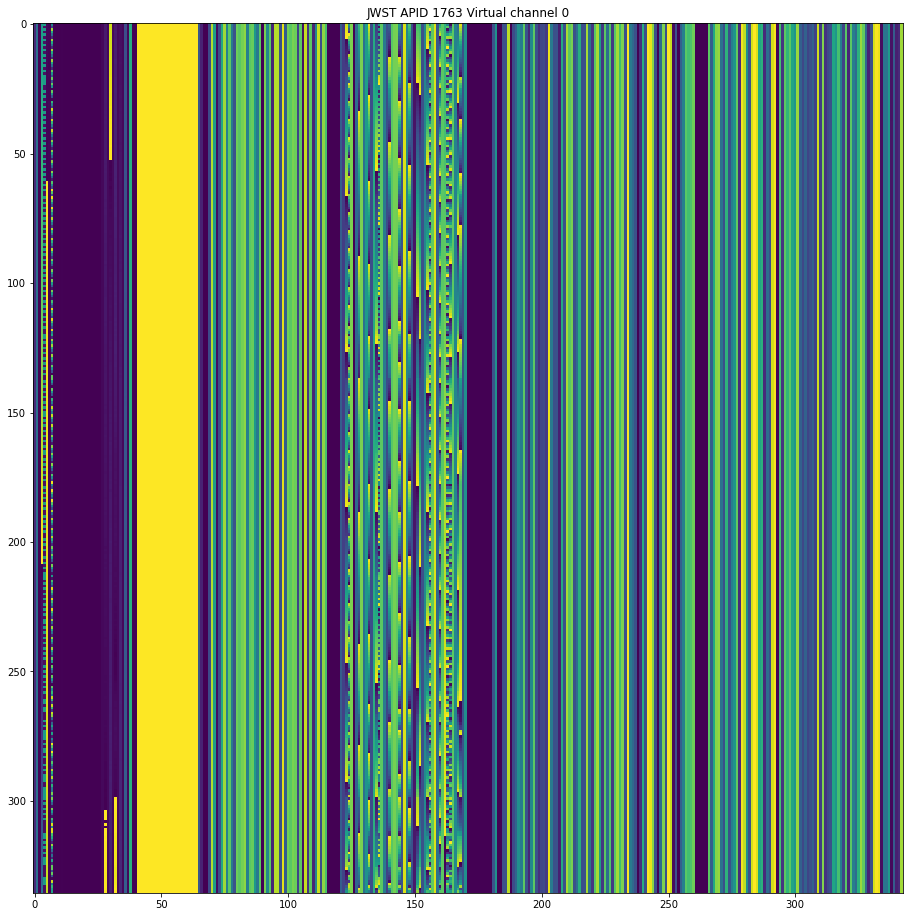

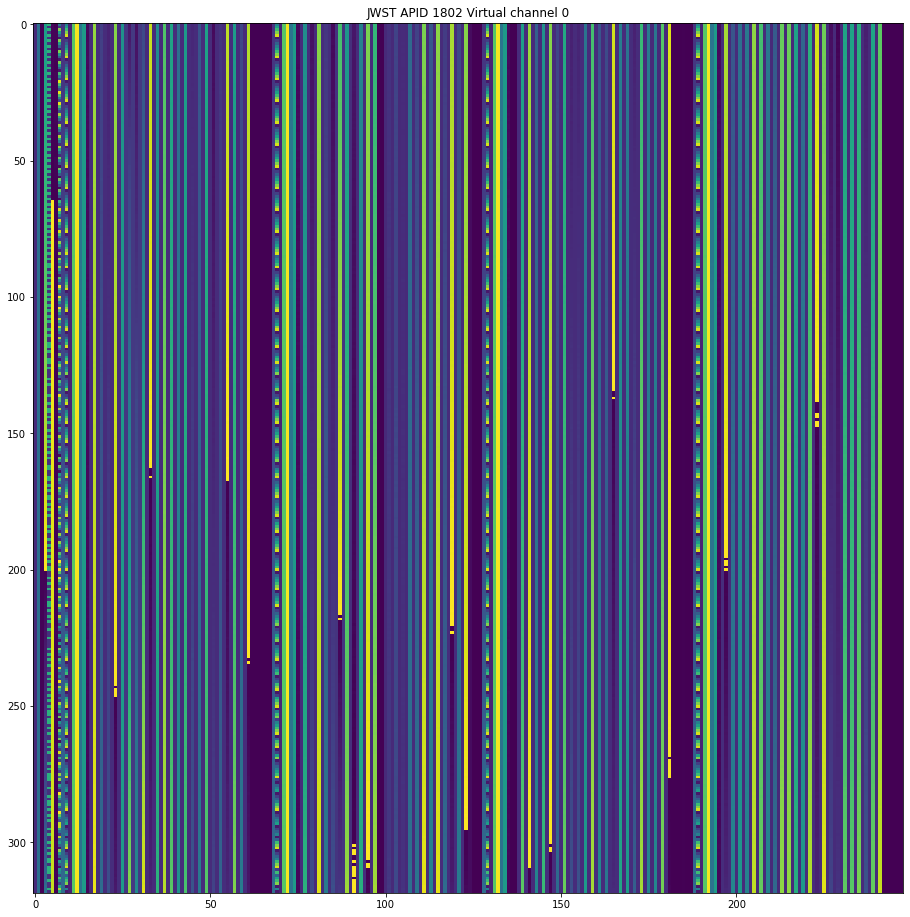

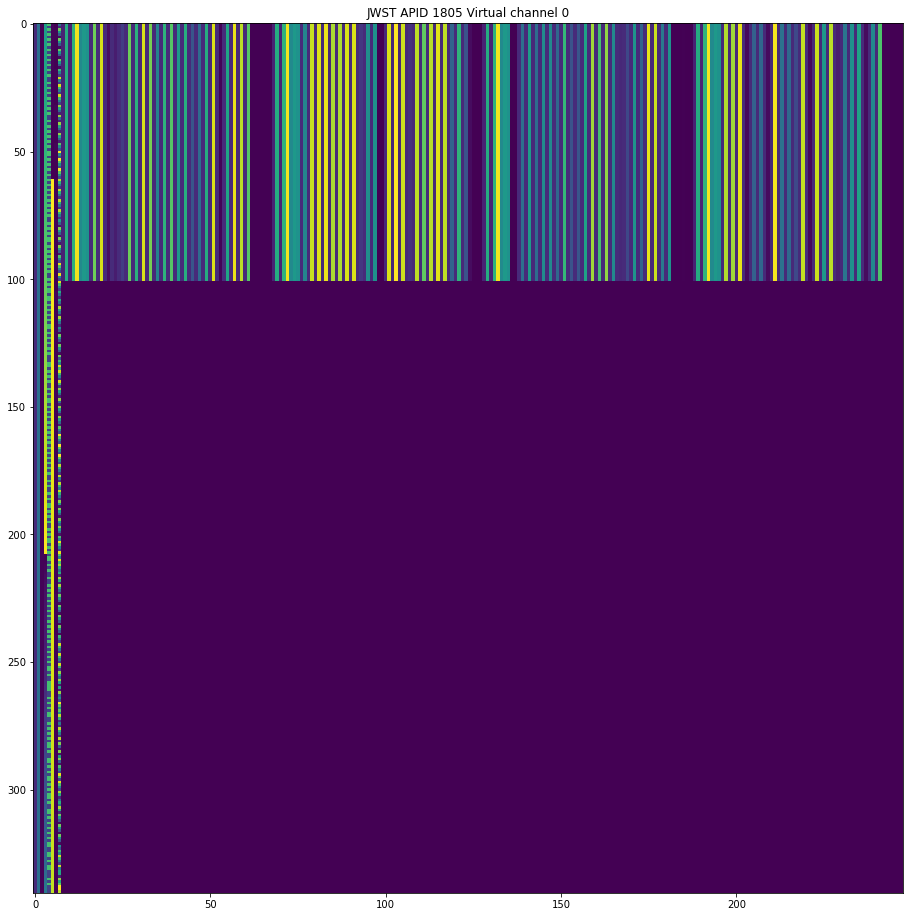

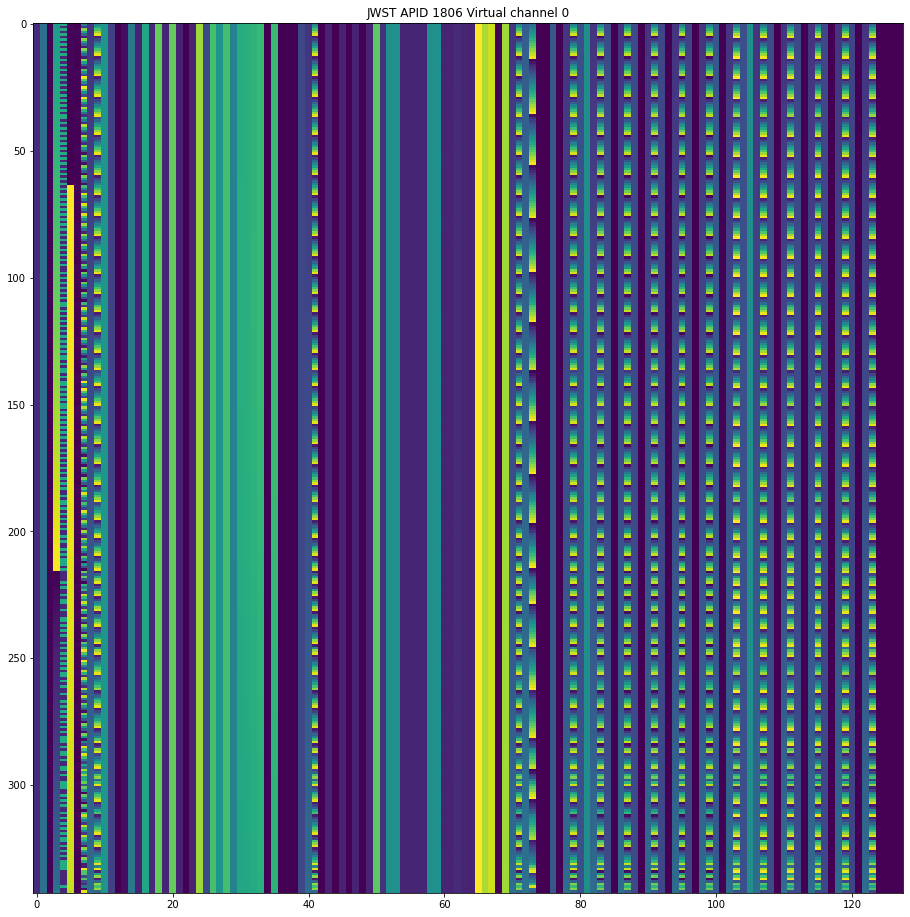

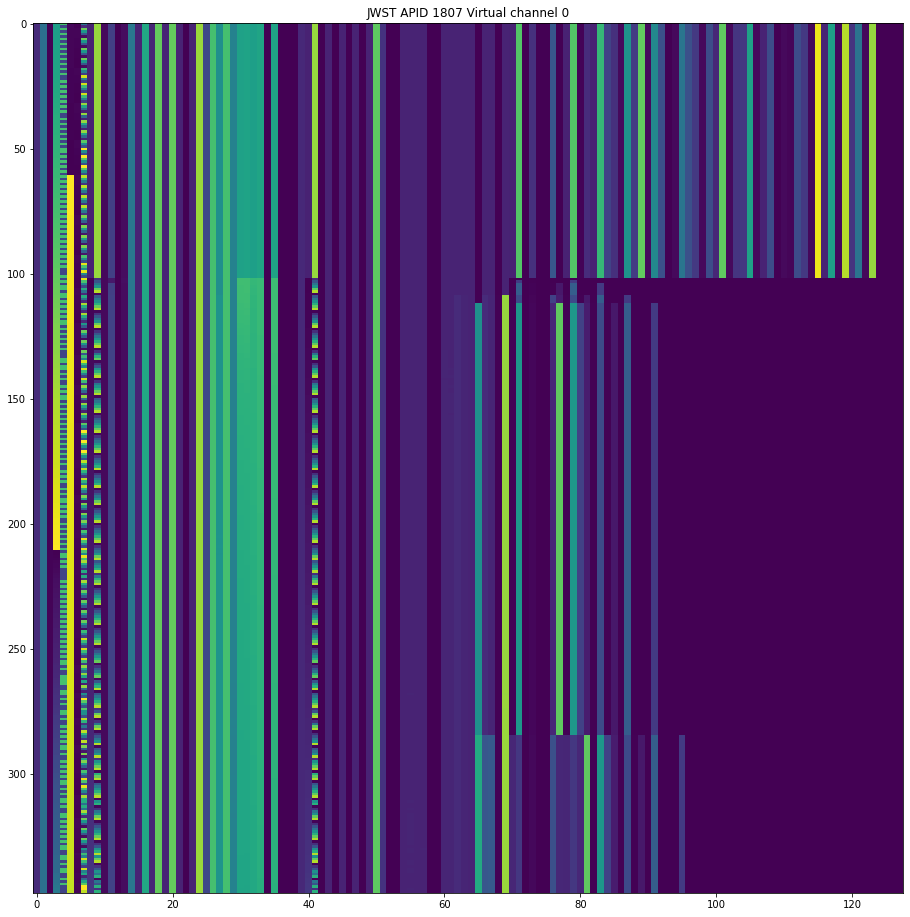

In [26]:
plot_apids(vc0_by_apid)

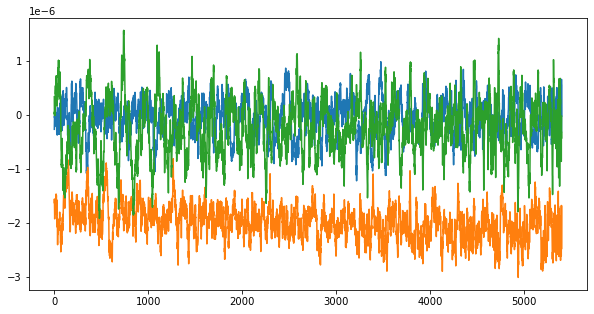

In [27]:
plt.plot(packets_asarray(vc0_by_apid[1201])[:, 258:].ravel().view('float32').byteswap().reshape((-1, 3)))

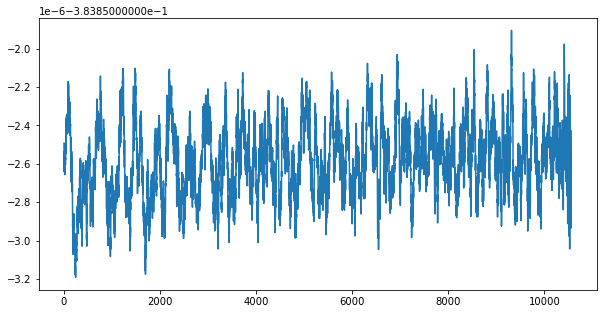

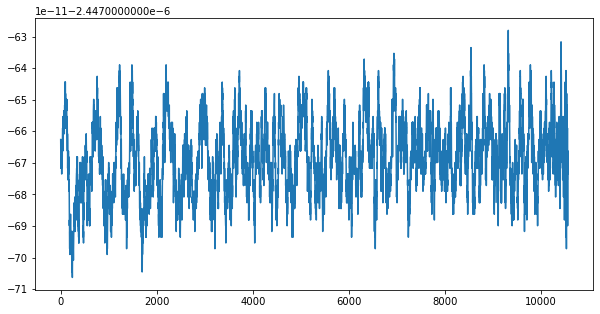

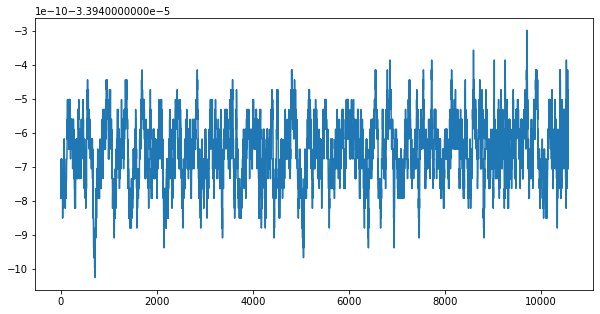

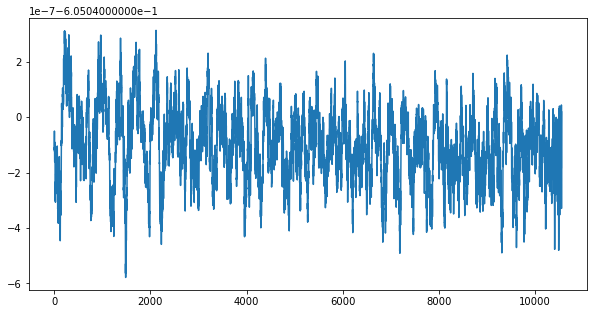

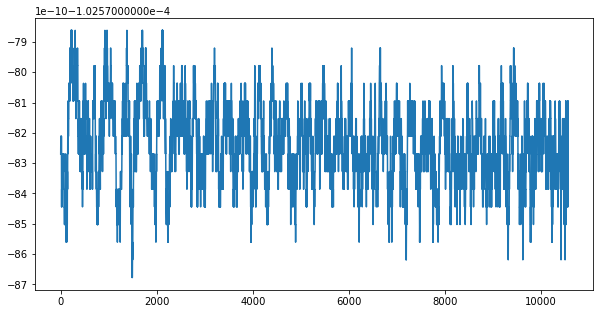

In [28]:
sel = np.array([0, 2, 4, 5, 7])
for x in packets_asarray(vc0_by_apid[1403])[:, 179:179+8*10].ravel().view('float64').byteswap().reshape((-1, 10))[:, sel].T:
    plt.figure()
    plt.plot(x)

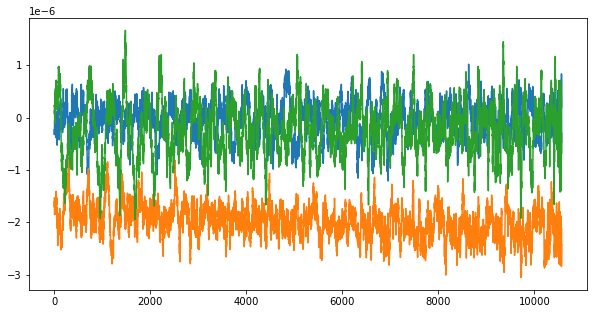

In [29]:
plt.plot(packets_asarray(vc0_by_apid[1404])[:, 94:94+12].ravel().view('float32').byteswap().reshape((-1, 3)))

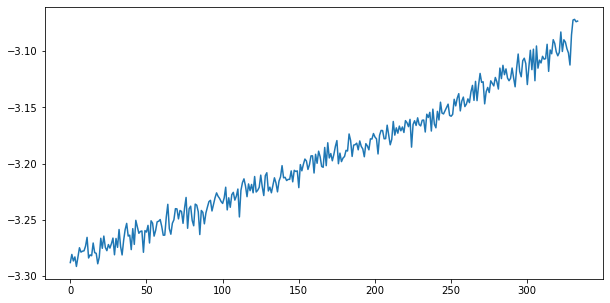

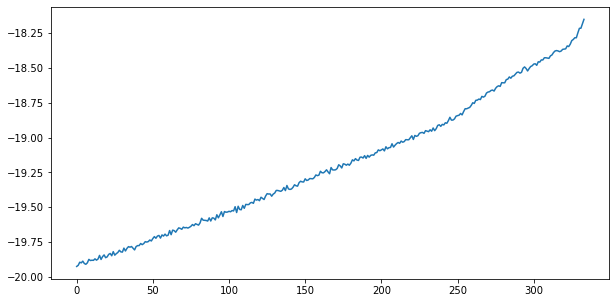

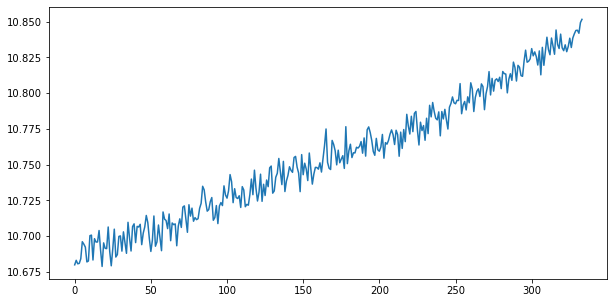

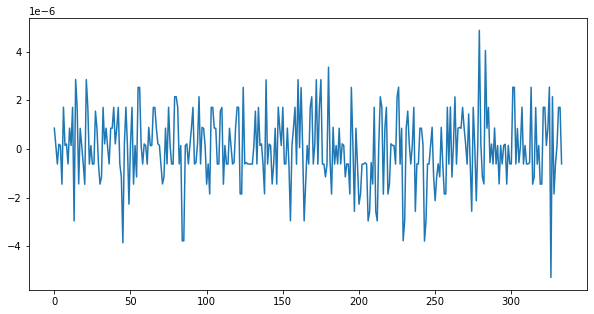

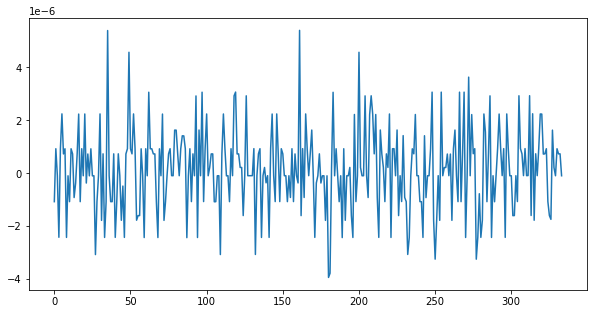

...

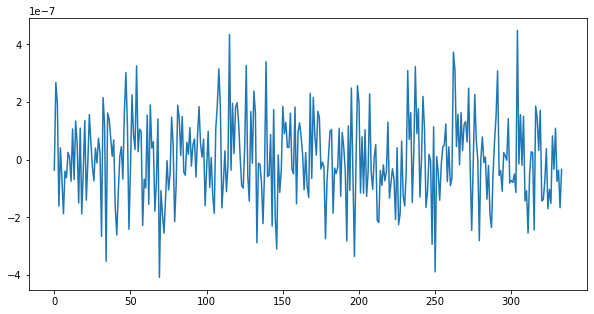

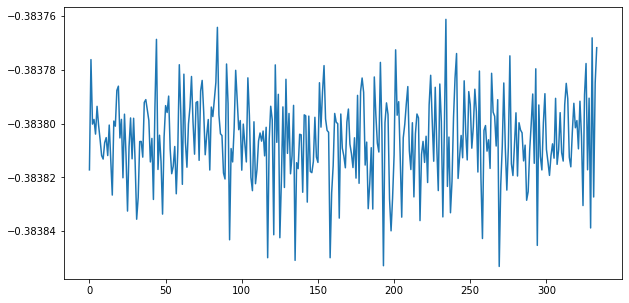

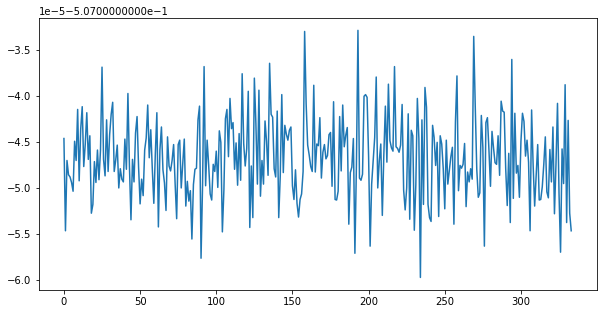

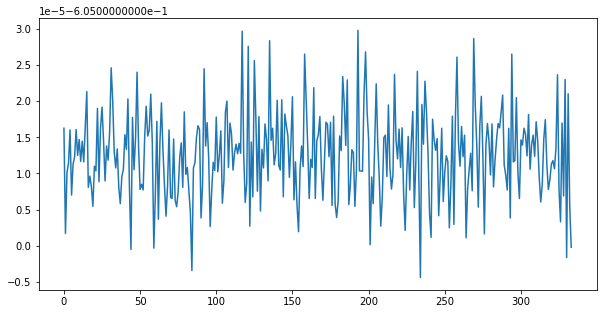

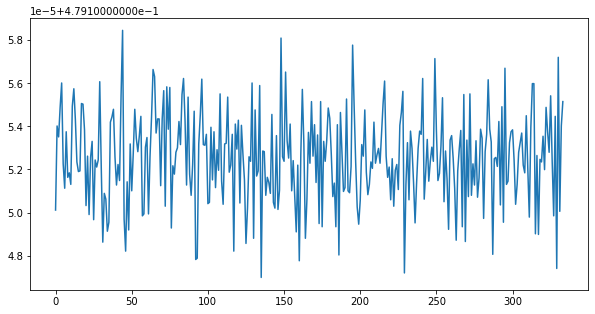

In [30]:
for x in packets_asarray(vc0_by_apid[1434])[:, 8:][:, :4*13].ravel().view('float32').byteswap().reshape(-1, 13).T:
    plt.figure()
    plt.plot(x)

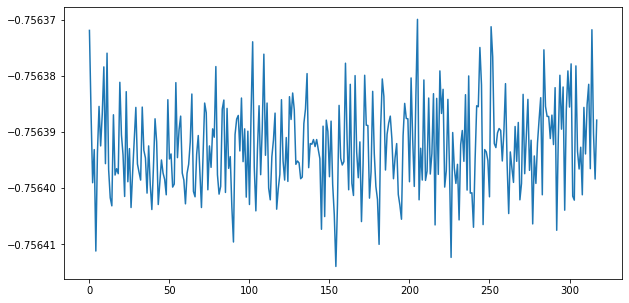

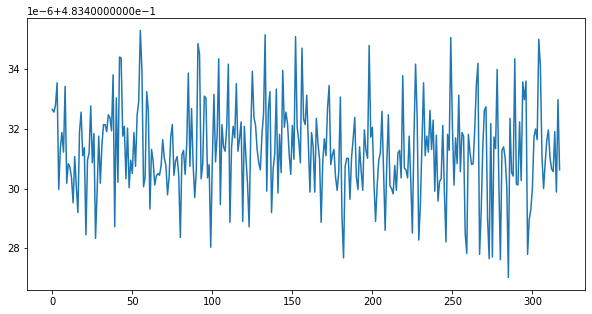

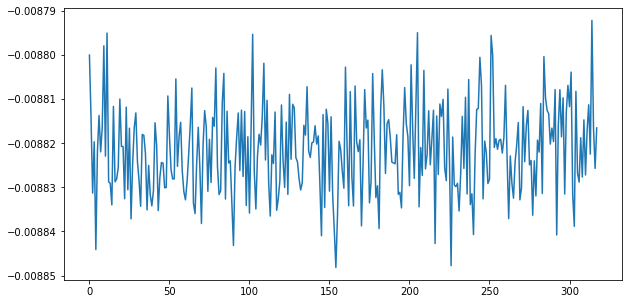

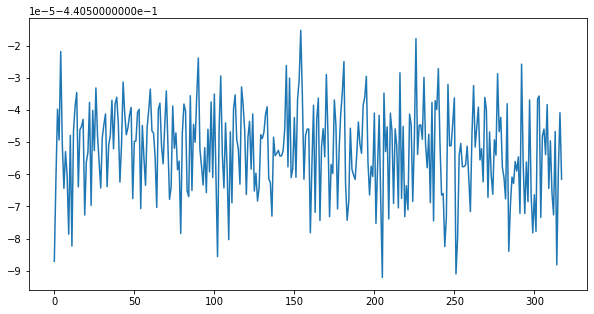

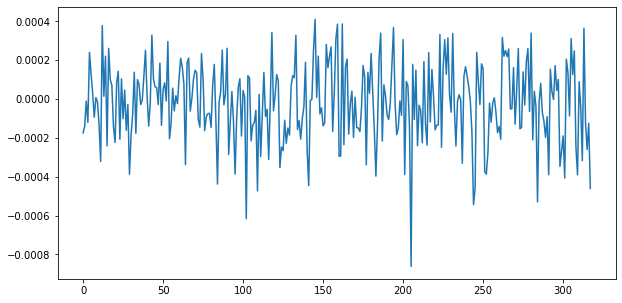

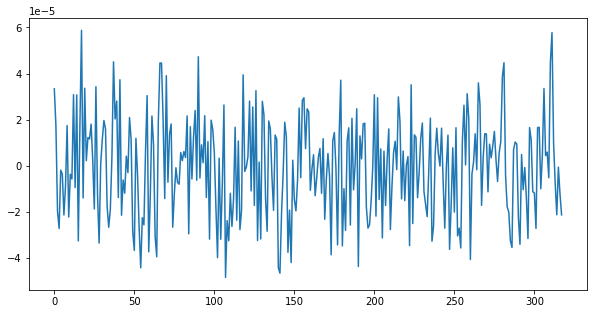

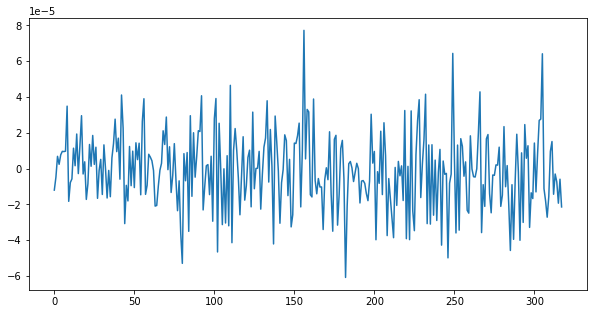

In [31]:
for x in packets_asarray(vc0_by_apid[1439])[:, 44:][:, :4*7].ravel().view('float32').byteswap().reshape(-1, 7).T:
    plt.figure()
    plt.plot(x)

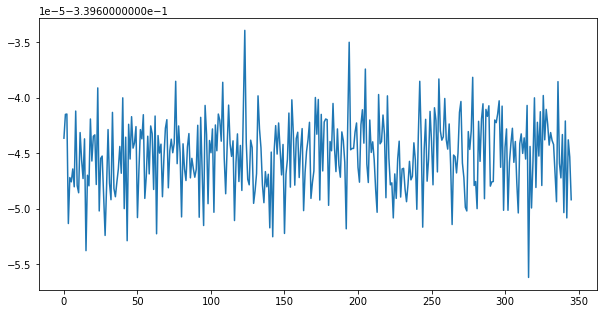

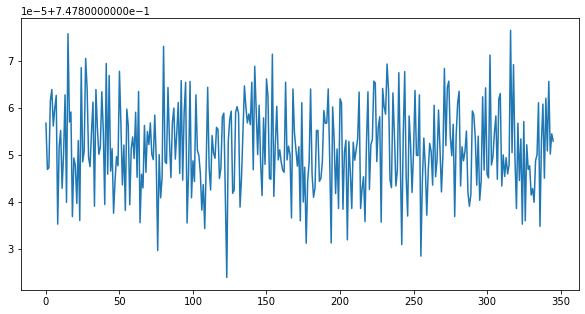

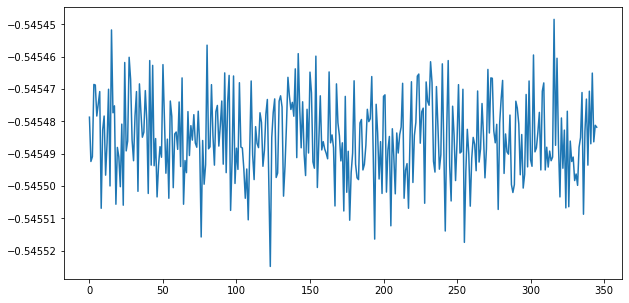

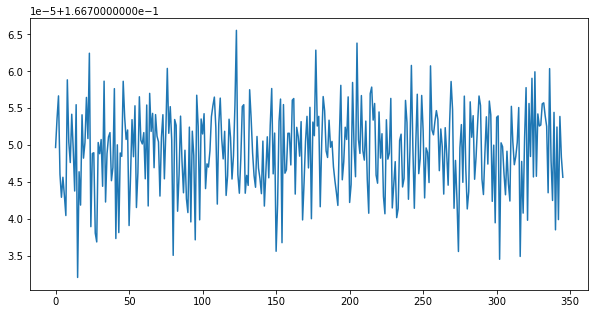

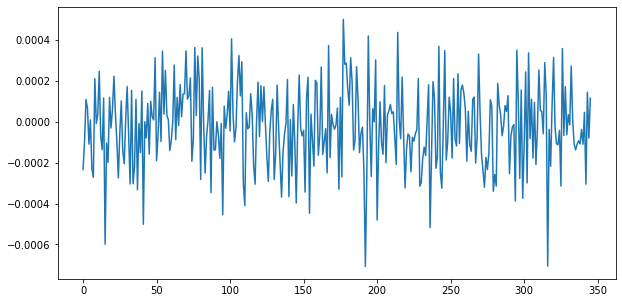

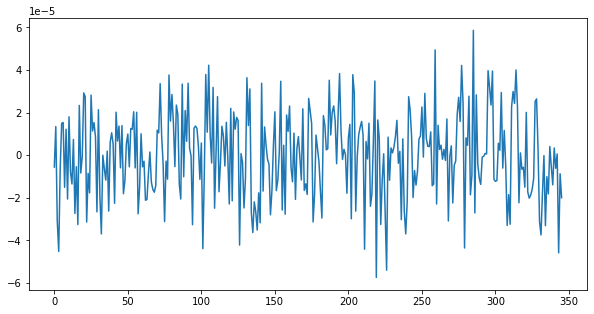

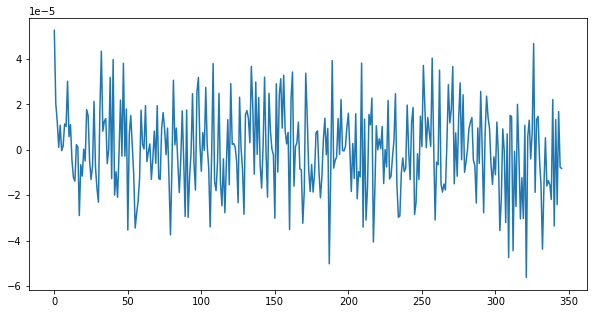

In [32]:
for x in packets_asarray(vc0_by_apid[1440])[:, 144:][:, :4*7].ravel().view('float32').byteswap().reshape(-1, 7).T:
    plt.figure()
    plt.plot(x)

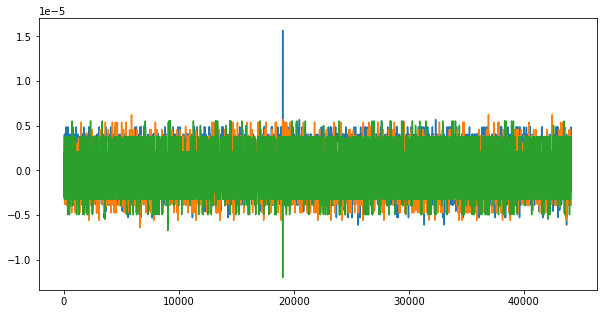

In [33]:
plt.plot(packets_asarray(vc0_by_apid[1727])[:, 8:][:, :4*3].ravel().view('float32').byteswap().reshape(-1, 3))

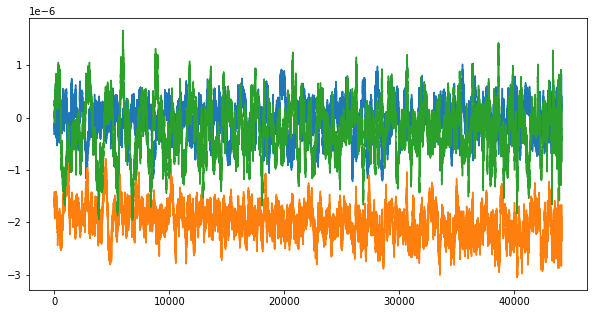

In [34]:
plt.plot(packets_asarray(vc0_by_apid[1727])[:, 32:][:, :4*3].ravel().view('float32').byteswap().reshape(-1, 3))

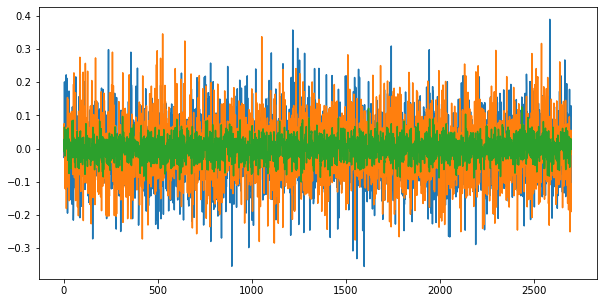

In [35]:
plt.plot(packets_asarray(vc0_by_apid[1730])[:, 188:][:, :4*3].ravel().view('float32').byteswap().reshape(-1, 3))

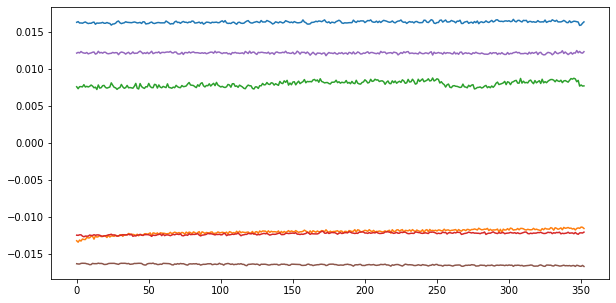

In [36]:
plt.plot(packets_asarray(vc0_by_apid[1755])[:, 63:][:, :4*6].ravel().view('float32').byteswap().reshape(-1, 6))

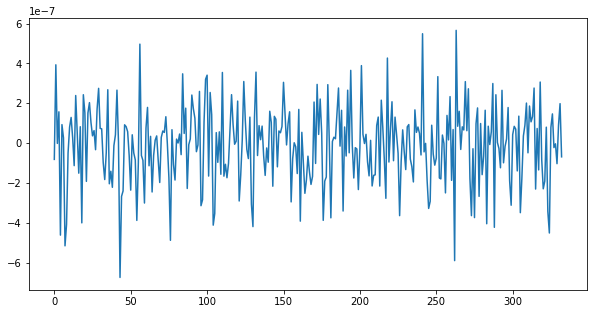

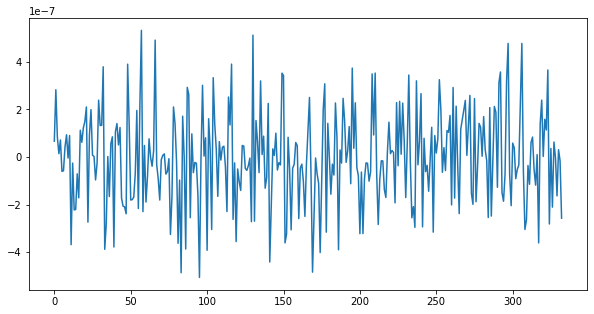

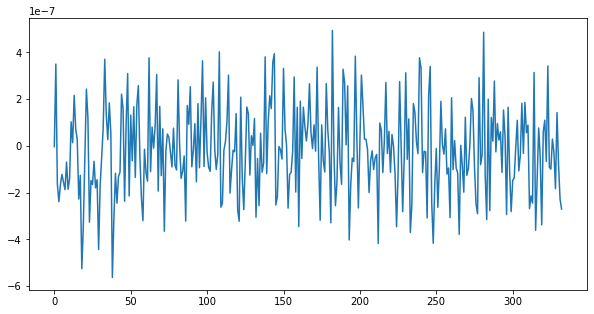

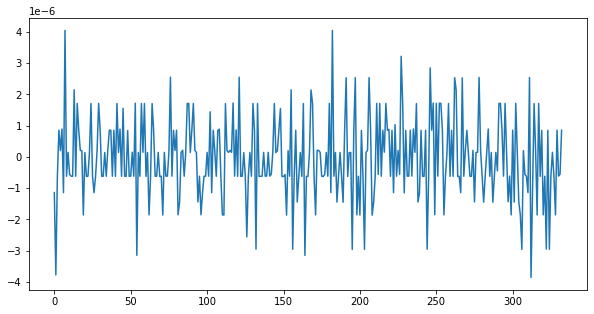

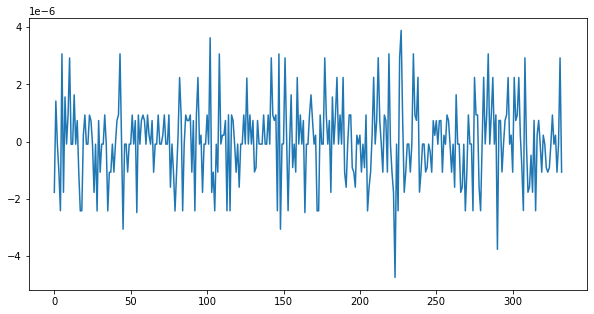

...

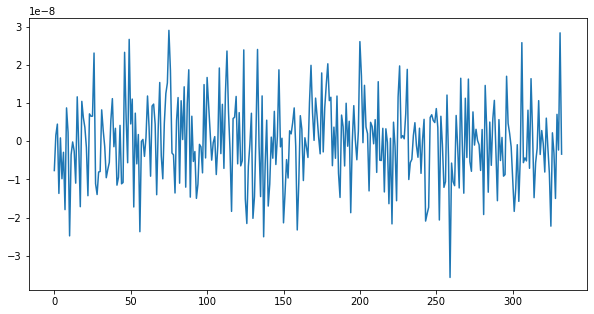

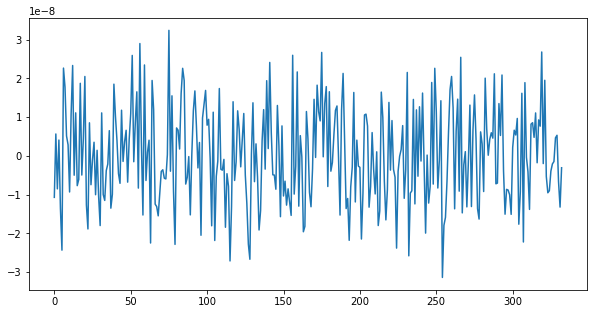

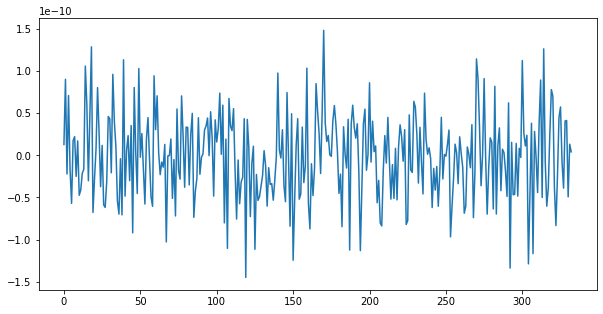

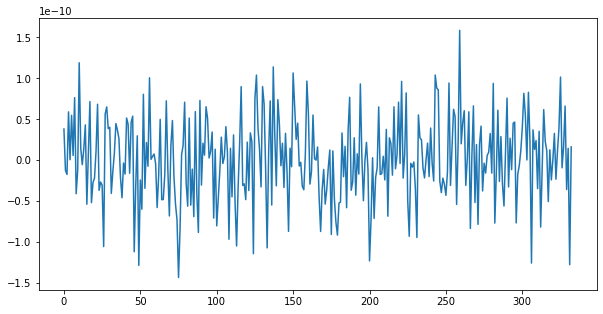

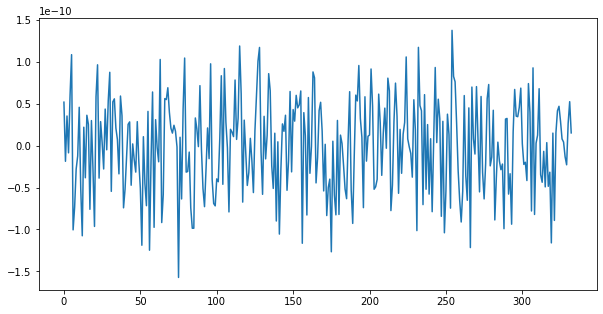

In [37]:
for x in packets_asarray(vc0_by_apid[1756])[:, 137:][:, :4*12].ravel().view('float32').byteswap().reshape(-1, 12).T:
    plt.figure()
    plt.plot(x)

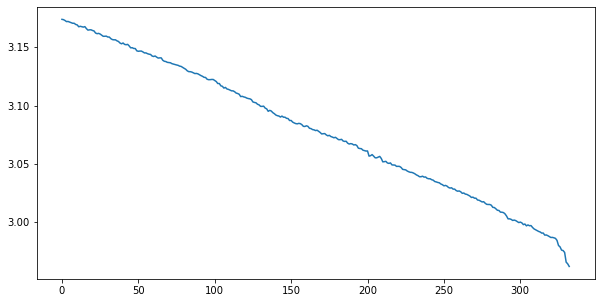

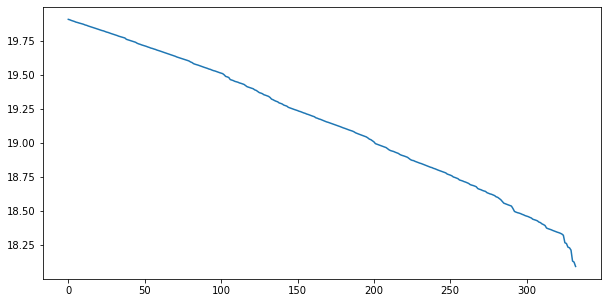

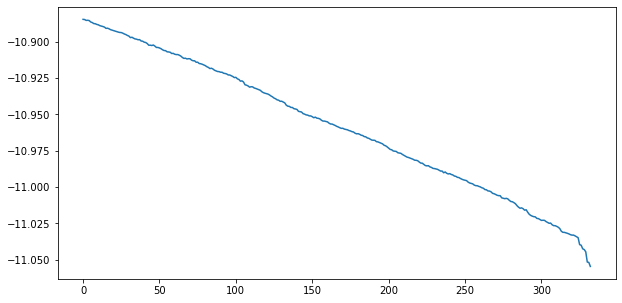

In [38]:
for x in packets_asarray(vc0_by_apid[1756])[:, 193:][:, :4*3].ravel().view('float32').byteswap().reshape(-1, 3).T:
    plt.figure()
    plt.plot(x)

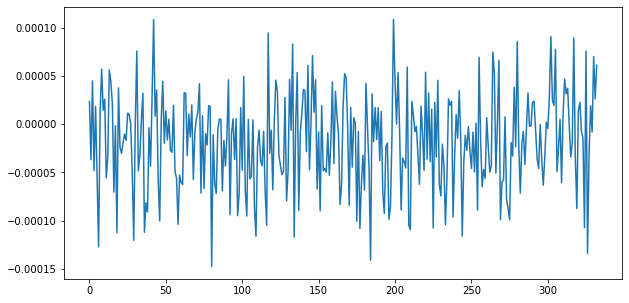

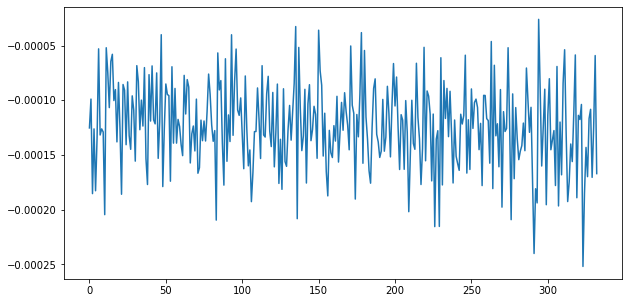

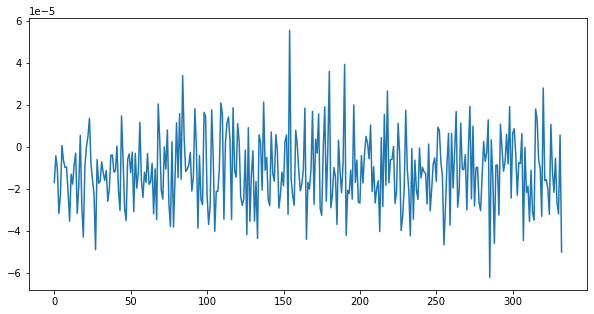

In [39]:
for x in packets_asarray(vc0_by_apid[1756])[:, 246:][:, :4*3].ravel().view('float32').byteswap().reshape(-1, 3).T:
    plt.figure()
    plt.plot(x)

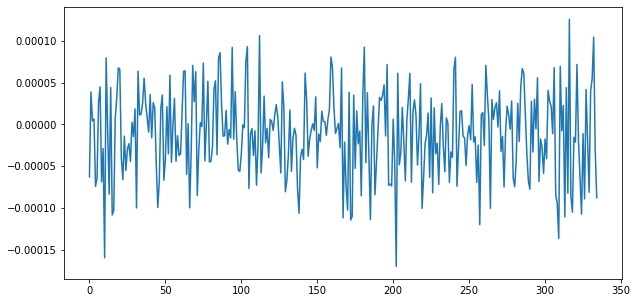

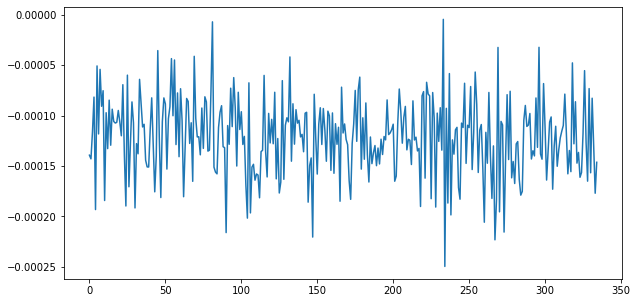

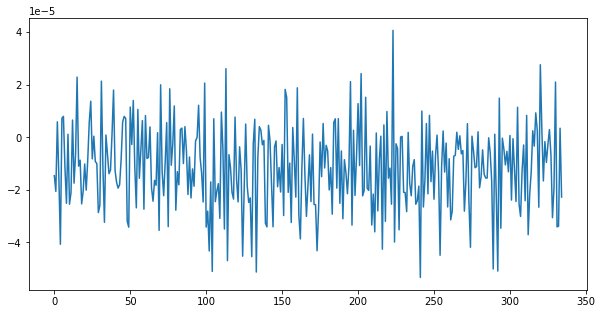

In [40]:
for x in packets_asarray(vc0_by_apid[1758])[:, 90:][:, :4*3].ravel().view('float32').byteswap().reshape(-1, 3).T:
    plt.figure()
    plt.plot(x)

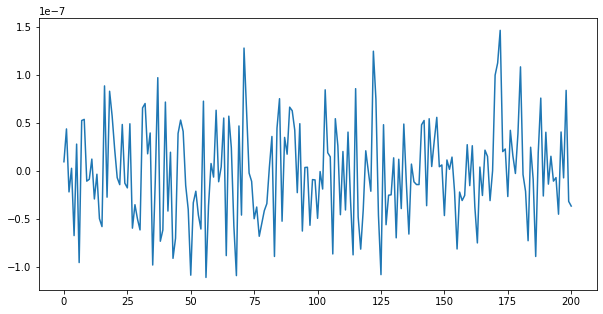

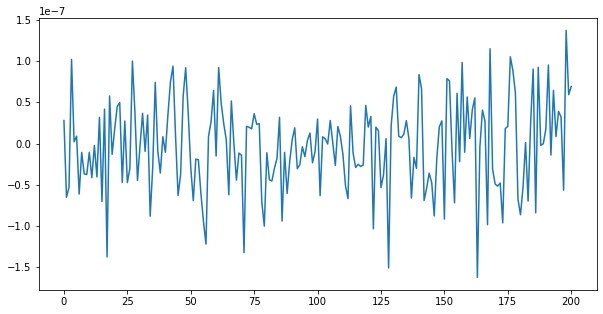

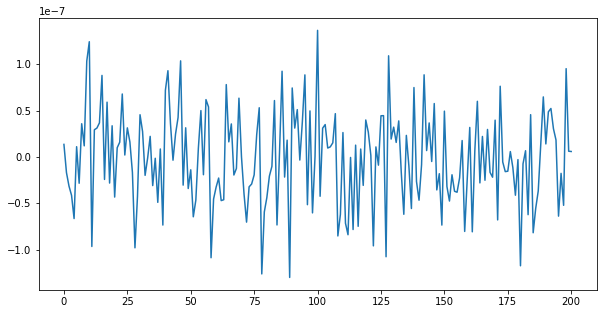

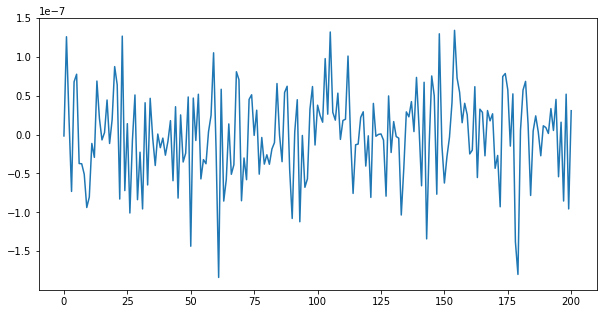

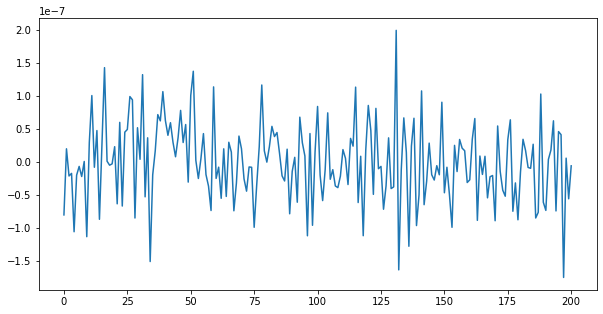

In [41]:
for x in packets_asarray(vc0_by_apid[1758])[:, 118:][:, :4*5].ravel().view('float32').byteswap().reshape(-1, 5).T:
    plt.figure()
    plt.plot(x)

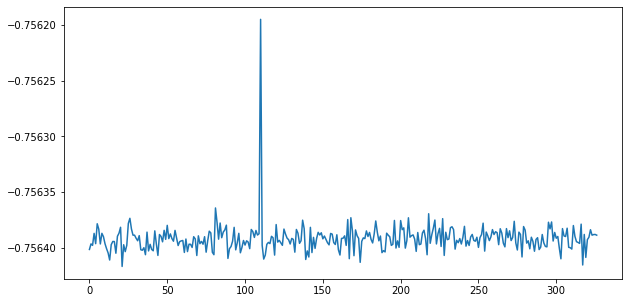

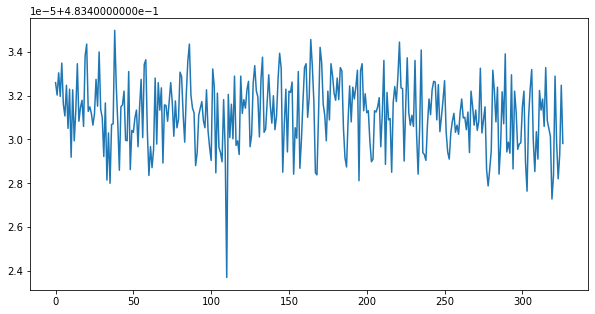

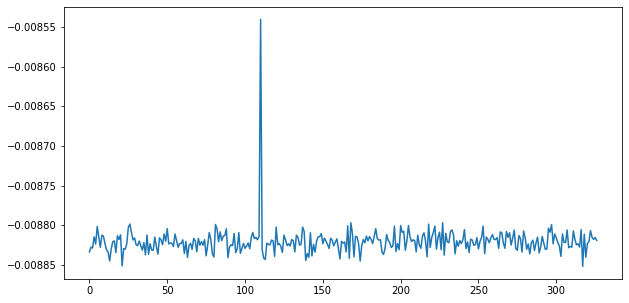

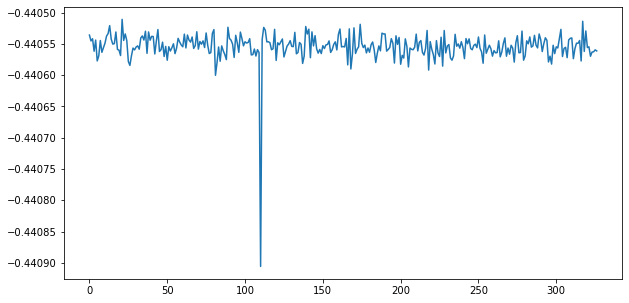

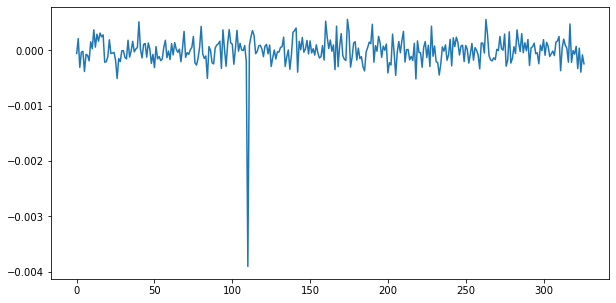

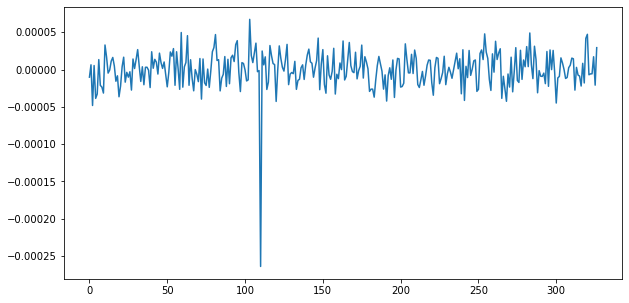

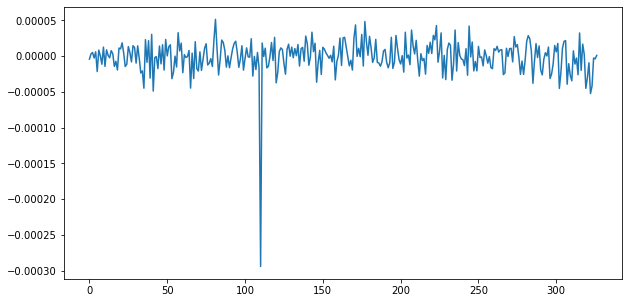

In [42]:
for x in packets_asarray(vc0_by_apid[1761])[:, 274:][:, :4*7].ravel().view('float32').byteswap().reshape(-1, 7).T:
    plt.figure()
    plt.plot(x)

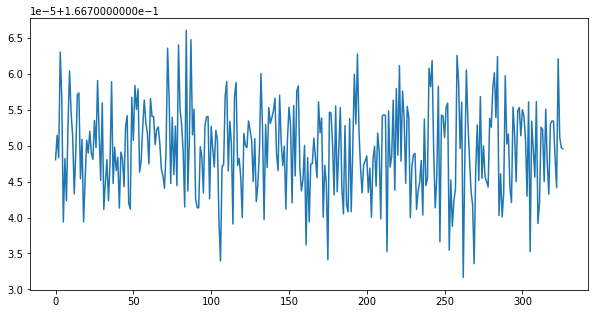

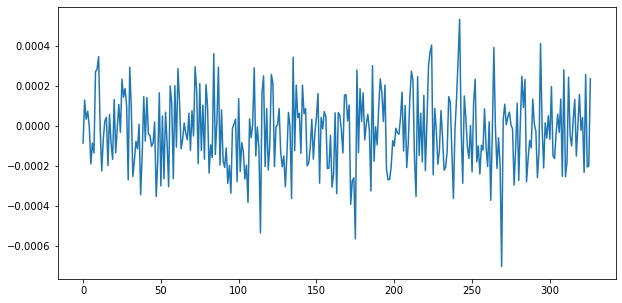

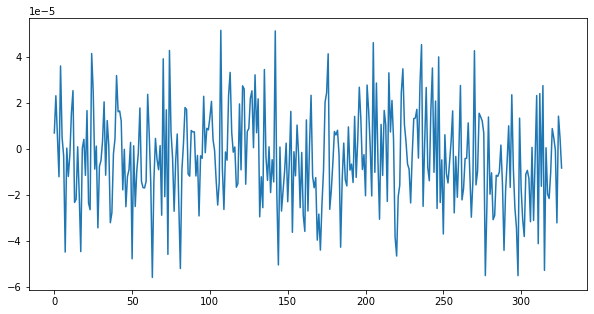

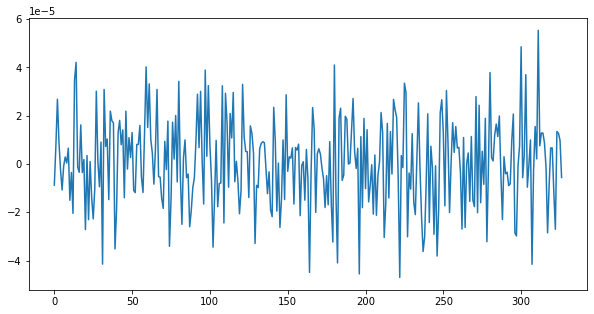

In [43]:
for x in packets_asarray(vc0_by_apid[1761])[:, 350:][:, :4*4].ravel().view('float32').byteswap().reshape(-1, 4).T:
    plt.figure()
    plt.plot(x)